This script sets up a data analysis and machine learning pipeline using Python. It includes libraries for data manipulation (pandas, numpy), visualization (matplotlib, seaborn), and machine learning (sklearn). Key functionalities involve handling missing data, encoding categorical variables, scaling features, splitting datasets, and building a classification model using Random Forest. It also includes tools for model evaluation like confusion matrices and classification reports, with warnings suppressed for cleaner output.# 

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

# Read the dataset


In [8]:
df = pd.read_csv('/kaggle/input/music-genre-classification/train.csv')
df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Bruno Mars,That's What I Like (feat. Gucci Mane),60.0,0.854,0.564,1.0,-4.964,1,0.0485,0.017100,NaN,0.0849,0.8990,134.071,234596.0,4,5
1,Boston,Hitch a Ride,54.0,0.382,0.814,3.0,-7.230,1,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4,10
2,The Raincoats,No Side to Fall In,35.0,0.434,0.614,6.0,-8.334,1,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4,6
3,Deno,Lingo (feat. J.I & Chunkz),66.0,0.853,0.597,10.0,-6.528,0,0.0555,0.021200,NaN,0.1220,0.5690,107.033,173968.0,4,5
4,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,53.0,0.167,0.975,2.0,-4.279,1,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17991,Green-House,Find Home,35.0,0.166,0.109,7.0,-17.100,0,0.0413,0.993000,0.824000,0.0984,0.1770,171.587,193450.0,3,6
17992,Micatone,All Gone,27.0,0.638,0.223,11.0,-10.174,0,0.0329,0.858000,0.000016,0.0705,0.3350,73.016,257067.0,4,2
17993,Smash Hit Combo,Peine perdue,34.0,0.558,0.981,4.0,-4.683,0,0.0712,0.000030,0.000136,0.6660,0.2620,105.000,216222.0,4,8
17994,Beherit,Salomon's Gate,29.0,0.215,0.805,6.0,-12.757,0,0.1340,0.001290,0.916000,0.2560,0.3550,131.363,219693.0,4,8


It prints first five attributes

In [9]:
df.head()

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Bruno Mars,That's What I Like (feat. Gucci Mane),60.0,0.854,0.564,1.0,-4.964,1,0.0485,0.017100,NaN,0.0849,0.8990,134.071,234596.0,4,5
1,Boston,Hitch a Ride,54.0,0.382,0.814,3.0,-7.230,1,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4,10
2,The Raincoats,No Side to Fall In,35.0,0.434,0.614,6.0,-8.334,1,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4,6
3,Deno,Lingo (feat. J.I & Chunkz),66.0,0.853,0.597,10.0,-6.528,0,0.0555,0.021200,NaN,0.1220,0.5690,107.033,173968.0,4,5
4,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,53.0,0.167,0.975,2.0,-4.279,1,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4,10


it prints last five attribute

In [10]:
df.tail()

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
17991,Green-House,Find Home,35.0,0.166,0.109,7.0,-17.100,0,0.0413,0.99300,0.824000,0.0984,0.177,171.587,193450.0,3,6
17992,Micatone,All Gone,27.0,0.638,0.223,11.0,-10.174,0,0.0329,0.85800,0.000016,0.0705,0.335,73.016,257067.0,4,2
17993,Smash Hit Combo,Peine perdue,34.0,0.558,0.981,4.0,-4.683,0,0.0712,0.00003,0.000136,0.6660,0.262,105.000,216222.0,4,8
17994,Beherit,Salomon's Gate,29.0,0.215,0.805,6.0,-12.757,0,0.1340,0.00129,0.916000,0.2560,0.355,131.363,219693.0,4,8
17995,The Raconteurs,Broken Boy Soldier,43.0,0.400,0.853,4.0,-5.320,0,0.0591,0.00604,0.212000,0.3340,0.377,138.102,182227.0,4,10


Taking 10 random samples

In [11]:
df.sample(10)

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
1111,Franz Ferdinand,Take Me Out,78.0,0.2770,0.6630,4.0,-8.821,0,0.0377,0.000409,0.000510,0.1360,0.5270,104.561,237027.000000,4,6
473,Rekha Bhardwaj,Badi Dheere Jali,25.0,0.4390,0.3640,10.0,-10.723,1,0.0341,0.877000,0.007000,0.0776,0.1110,80.202,7.023267,4,0
169,Crown Lands,Howlin' Back Again,39.0,0.4940,0.9690,6.0,-2.694,1,0.2220,0.172000,0.001580,0.1480,0.1650,121.214,169808.000000,4,10
3247,"Igor Stravinsky, Concertgebouworkest, Riccardo...",Apollon musagète (1947 Version): 8. Pas de deu...,21.0,0.0993,0.0154,NaN,-34.797,1,0.0375,0.942000,0.470000,0.0640,0.0764,88.646,3.916667,4,7
14274,Ravid Plotnik,◊î◊©◊û◊ó◊î (◊†◊¶'◊ô ◊†◊¶'),31.0,0.6260,0.4250,NaN,-7.753,0,0.0349,0.305000,NaN,0.2730,0.2160,135.342,252907.000000,4,5
8932,Pattern-Seeking Animals,Raining Hard in Heaven,18.0,0.3400,0.5970,5.0,-7.224,1,0.0317,0.015700,0.026900,0.1140,0.2290,114.100,511088.000000,4,10
17498,Tokimeki Records,Night Birds (feat. Froya & ÂÆÆËÑáÁøîÂπ≥),32.0,0.7020,0.6910,8.0,-9.243,1,0.0656,0.001090,0.440000,0.2320,0.6690,117.984,294584.000000,4,9
15709,Celso Blues Boy,Por um Monte de Cerveja,28.0,0.6130,0.8780,4.0,-5.731,1,0.0313,0.007770,0.000092,0.1680,0.9020,129.991,232699.000000,4,2
2883,"Imaginary Future, Kina Grannis",I Will Spend My Whole Life Loving You,64.0,0.6370,0.1290,11.0,-17.082,1,0.0346,0.887000,NaN,0.0719,0.2980,125.802,3.793650,4,0
15610,The Maccabees,Marks To Prove It,44.0,0.1800,0.9160,7.0,-6.788,1,0.0923,0.000975,0.224000,0.0945,0.1860,85.614,254547.000000,4,6


Number of rows and column

In [12]:
df.shape

(17996, 17)

Summary of the input data

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17996 entries, 0 to 17995
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Artist Name         17996 non-null  object 
 1   Track Name          17996 non-null  object 
 2   Popularity          17568 non-null  float64
 3   danceability        17996 non-null  float64
 4   energy              17996 non-null  float64
 5   key                 15982 non-null  float64
 6   loudness            17996 non-null  float64
 7   mode                17996 non-null  int64  
 8   speechiness         17996 non-null  float64
 9   acousticness        17996 non-null  float64
 10  instrumentalness    13619 non-null  float64
 11  liveness            17996 non-null  float64
 12  valence             17996 non-null  float64
 13  tempo               17996 non-null  float64
 14  duration_in min/ms  17996 non-null  float64
 15  time_signature      17996 non-null  int64  
 16  Clas

Checking and adding the null attributes

In [14]:
df.isna().sum()

Artist Name              0
Track Name               0
Popularity             428
danceability             0
energy                   0
key                   2014
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness      4377
liveness                 0
valence                  0
tempo                    0
duration_in min/ms       0
time_signature           0
Class                    0
dtype: int64

# Data Cleaning

This code calculates the mean of the columns danceability, key, instrumentalness, and Popularity in the DataFrame df. It then fills any missing (NaN) values in these columns with their respective mean values, ensuring the dataset has no missing data for these features. This process is a common data imputation technique to handle missing values.

In [15]:
mean_danceability= df['danceability'].mean()
mean_key= df['key'].mean()
mean_instrumentalness= df['instrumentalness'].mean()
mean_Popularity = df['Popularity'].mean()

df['Popularity'] = df['Popularity'].fillna(mean_Popularity)
df['danceability'] = df['danceability'].fillna(mean_danceability)
df['key'] = df['key'].fillna(mean_key)
df['instrumentalness'] = df['instrumentalness'].fillna(mean_instrumentalness)

The line df.isna().sum() checks for missing (NaN) values in each column of the DataFrame df. It returns a summary showing the count of missing values for every column. This helps identify which columns have missing data and need further cleaning or imputation.

In [16]:
df.isna().sum()

Artist Name           0
Track Name            0
Popularity            0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
duration_in min/ms    0
time_signature        0
Class                 0
dtype: int64

# Data Stats

df.describe() summarizes data with stats like count, mean, std, min, max, and percentiles (25%, 50%, 75%) for numerical columns. Optionally, it provides unique, top, and frequency for non-numerical data.

In [17]:
df.describe()

,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
count,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,17996.000000,1.799600e+04,17996.000000,17996.000000
mean,44.512124,0.543433,0.662777,5.952447,-7.910660,0.636753,0.079707,0.247082,0.177562,0.196170,0.486208,122.623294,2.007445e+05,3.924039,6.695821
std,17.218436,0.166268,0.235373,3.012651,4.049151,0.480949,0.083576,0.310632,0.264499,0.159212,0.240195,29.571527,1.119891e+05,0.361618,3.206073
min,1.000000,0.059600,0.000020,1.000000,-39.952000,0.000000,0.022500,0.000000,0.000001,0.011900,0.018300,30.557000,5.016500e-01,1.000000,0.000000
25%,33.000000,0.432000,0.509000,4.000000,-9.538000,0.000000,0.034800,0.004300,0.000294,0.097500,0.297000,99.620750,1.663370e+05,4.000000,5.000000
50%,44.000000,0.545000,0.700000,5.952447,-7.016000,1.000000,0.047400,0.081400,0.049850,0.129000,0.481000,120.065500,2.091600e+05,4.000000,8.000000
75%,56.000000,0.659000,0.860000,8.000000,-5.189000,1.000000,0.083000,0.434000,0.177562,0.258000,0.672000,141.969250,2.524900e+05,4.000000,10.000000
max,100.000000,0.989000,1.000000,11.000000,1.355000,1.000000,0.955000,0.996000,0.996000,1.000000,0.986000,217.416000,1.477187e+06,5.000000,10.000000


# Data Distribution

This code creates a grid of histograms (4x3) for each column in the list columns from the DataFrame df, using Seaborn's histplot with KDE overlays. It assigns unique colors to each plot, titles them with column names, and adjusts the layout for better visualization.

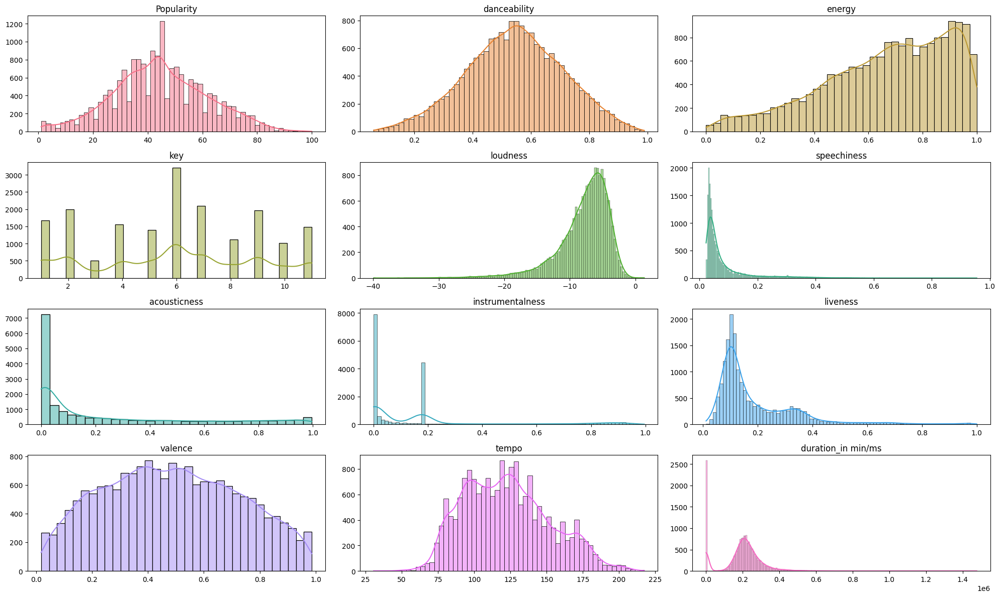

In [18]:
columns = [
    "Popularity", "danceability", "energy", "key", "loudness",
    "speechiness", "acousticness", "instrumentalness",
    "liveness", "valence", "tempo", "duration_in min/ms",
]
colors = sns.color_palette("husl", len(columns))

# Create a 4x3 grid for histograms
fig, axes = plt.subplots(4, 3, figsize=(20, 12))
axes = axes.flatten()

# Plot each column in the grid
for i, column in enumerate(columns):
    sns.histplot(df[column], kde=True, ax=axes[i], color=colors[i])
    axes[i].set_title(column)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

# Remove any empty subplots
for j in range(len(columns), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


This code generates a 4x3 grid of horizontal box plots for each column in the columns list from the DataFrame df. Unique colors are applied to each plot, titles display column names, and axes are labeled generically. Empty subplots are removed, and the layout is adjusted for clarity.

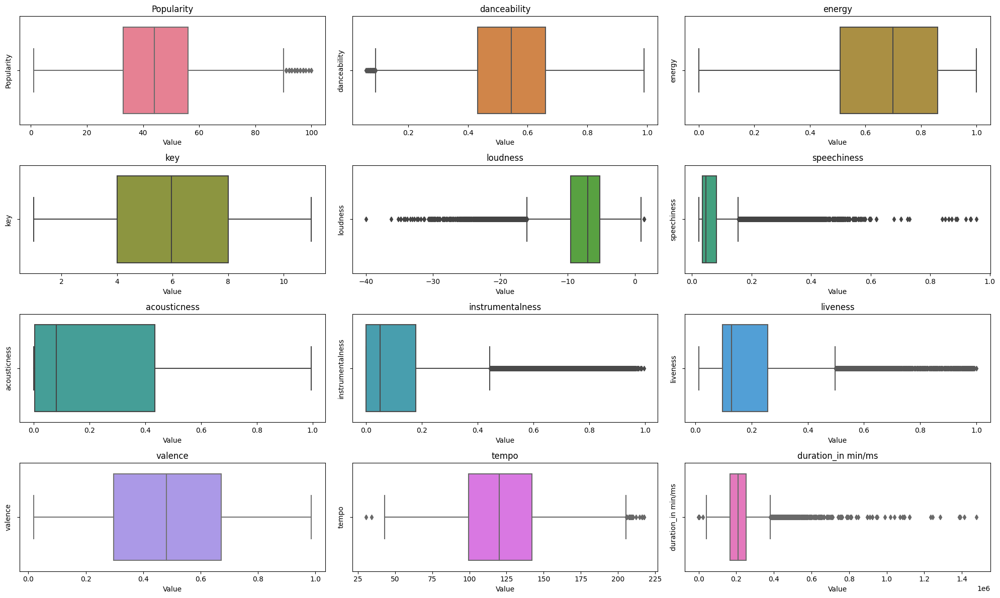

In [19]:
# Define a list of unique colors (length should match or exceed the number of columns)
colors = sns.color_palette("husl", len(columns))  # 'husl' generates visually distinct colors

# Create a 4x3 grid for box plots
fig, axes = plt.subplots(4, 3, figsize=(20, 12))
axes = axes.flatten()

# Plot each column in the grid
for i, column in enumerate(columns):
    sns.boxplot(data=df, x=column, ax=axes[i], color=colors[i])  # Set `x=column` for horizontal box plots
    axes[i].set_title(column)
    axes[i].set_xlabel("Value")  # Generic x-axis label for all plots
    axes[i].set_ylabel(column)  # Show the column name on the y-axis

# Remove any empty subplots
for j in range(len(columns), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


# Data Correlations

This code creates a pairplot for the specified columns in the DataFrame df. It visualizes pairwise relationships between columns using scatter plots and KDE plots for diagonal distributions. Opacity (alpha) and point size (s) are customized for clarity.

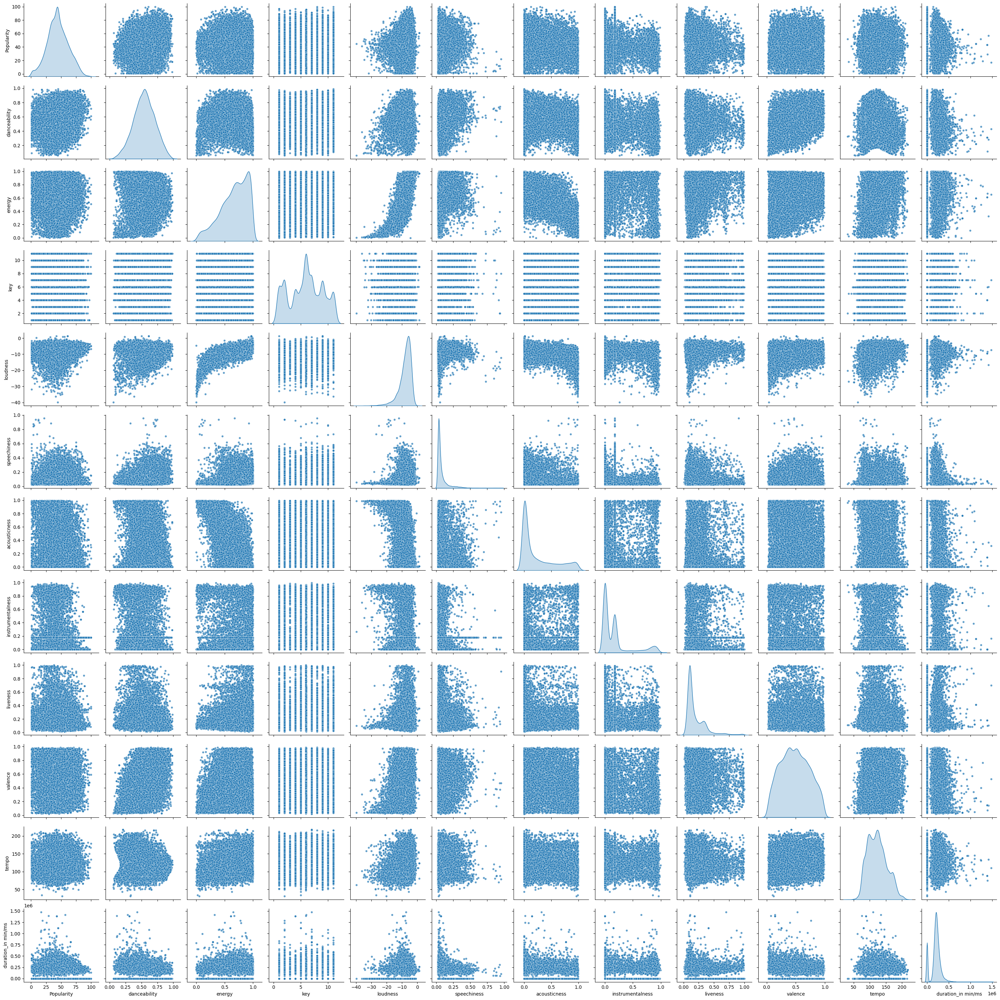

In [20]:
# Select only the relevant columns from the DataFrame
correlation_data = df[columns]

# Create a pairplot for the selected columns
sns.pairplot(correlation_data, diag_kind="kde", plot_kws={"alpha": 0.7, "s": 20})

# Show the plots
plt.show()

This code computes the correlation matrix for the specified columns in df and visualizes it as a heatmap. The heatmap uses a coolwarm color palette, annotates correlation values, and highlights relationships between features. The plot is styled with a title and adjusted for clarity.

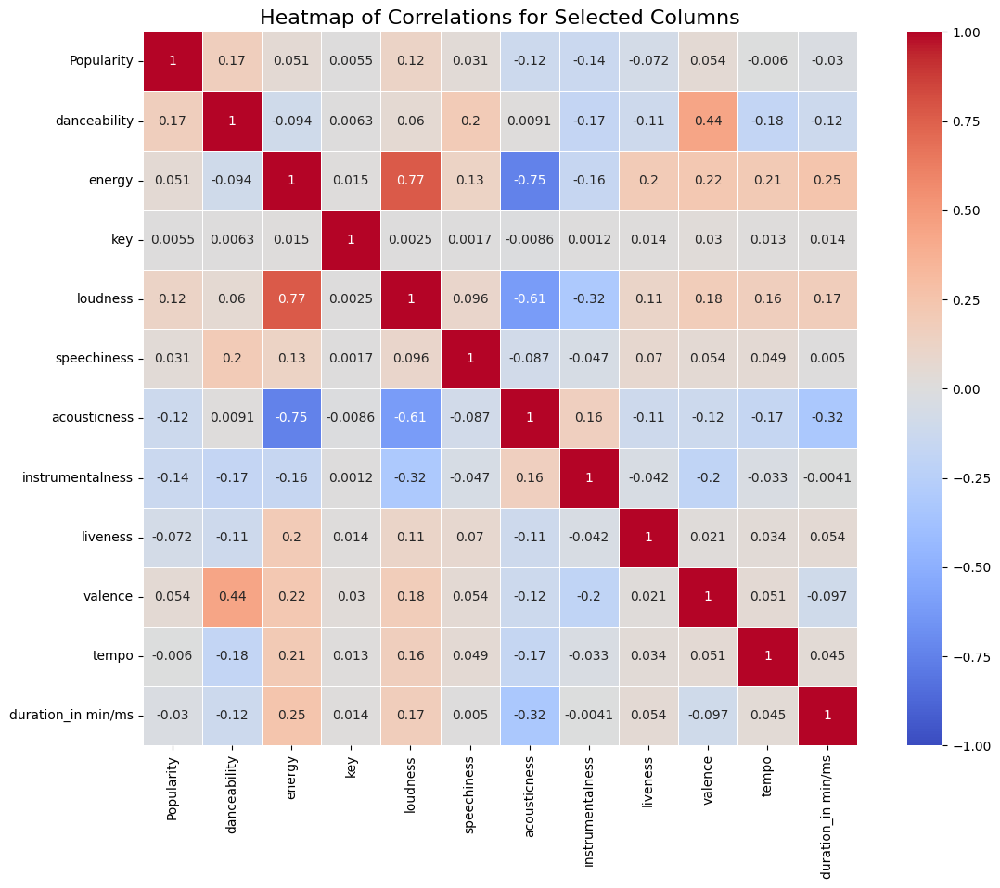

In [21]:
corr_data = df[columns].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(corr_data, annot=True, cmap='coolwarm', vmin=-1, vmax=1, square=True, linewidths=0.5)
plt.title('Heatmap of Correlations for Selected Columns', fontsize=16)
plt.show()

# Feature Engineering

This code scales the specified numerical columns in the DataFrame df using Min-Max Scaling from sklearn, transforming the values to a range between 0 and 1. This normalization ensures consistent scaling across features, improving performance for algorithms sensitive to feature magnitude.

In [22]:
from sklearn.preprocessing import MinMaxScaler

# Scale numerical columns
scaler = MinMaxScaler()
numerical_columns = [
    "Popularity", "danceability", "energy", "key", "loudness",
    "speechiness", "acousticness", "instrumentalness", "liveness",
    "valence", "tempo", "duration_in min/ms"
]
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

In [23]:
df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Bruno Mars,That's What I Like (feat. Gucci Mane),0.595960,0.854745,0.563991,0.0,0.847024,1,0.027882,0.017169,0.178274,0.073879,0.910096,0.553969,0.158812,4,5
1,Boston,Hitch a Ride,0.535354,0.346890,0.813996,0.2,0.792166,1,0.019410,0.001104,0.004025,0.090173,0.569081,0.459689,0.170413,4,10
2,The Raincoats,No Side to Fall In,0.343434,0.402841,0.613992,0.5,0.765439,1,0.032172,0.487952,0.000196,0.386702,0.794358,0.626804,0.074240,4,6
3,Deno,Lingo (feat. J.I & Chunkz),0.656566,0.853669,0.596992,0.9,0.809161,0,0.035389,0.021285,0.178274,0.111426,0.569081,0.409271,0.117769,4,5
4,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,0.525253,0.115558,0.974999,0.1,0.863607,1,0.207507,0.000170,0.016164,0.162028,0.075953,0.901766,0.155674,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17991,Green-House,Find Home,0.343434,0.114482,0.108982,0.6,0.553223,0,0.020161,0.996988,0.827309,0.087542,0.163997,0.754740,0.130958,3,6
17992,Micatone,All Gone,0.262626,0.622337,0.222984,1.0,0.720895,0,0.011153,0.861446,0.000015,0.059306,0.327271,0.227225,0.174024,4,2
17993,Smash Hit Combo,Peine perdue,0.333333,0.536260,0.981000,0.3,0.853826,0,0.052225,0.000030,0.000136,0.661978,0.251834,0.398391,0.146374,4,8
17994,Beherit,Salomon's Gate,0.282828,0.167205,0.804996,0.5,0.658363,0,0.119571,0.001295,0.919679,0.247040,0.347938,0.539476,0.148724,4,8


# ML Model Training

This code prepares data for machine learning by defining features (X) and the target variable (y). The features include all columns except Class, Artist Name, and Track Name, while the target is the Class column. Using train_test_split, the dataset is divided into training (80%) and testing (20%) subsets. A random state of 42 ensures reproducibility of the split. Finally, the shapes of the resulting datasets (X_train, X_test, y_train, y_test) are printed to verify the data partitioning.

In [24]:
from sklearn.model_selection import train_test_split

# Define features and target
X = df.drop(columns=['Class', 'Artist Name', 'Track Name'])  # Drop non-relevant columns
y = df['Class']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(14396, 14) (3600, 14) (14396,) (3600,)


The y.unique() function returns an array of unique values present in the y Series (or column). This is useful to identify all the distinct classes or categories in the target variable y.

In [25]:
y.unique()

array([ 5, 10,  6,  2,  4,  8,  9,  3,  7,  1,  0])

This code trains and evaluates five machine learning models (Logistic Regression, Decision Tree, Random Forest, SVC, and KNN) on the dataset. It calculates accuracy for each model by comparing predictions on the test set to actual labels, storing the results in a dictionary.

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier


# Step 4: Train and evaluate multiple models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Support Vector Classifier': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier()
}

results = {}

for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    results[model_name] = accuracy

In [27]:
results

{'Logistic Regression': 0.47583333333333333,
 'Decision Tree': 0.35833333333333334,
 'Random Forest': 0.4988888888888889,
 'Support Vector Classifier': 0.4633333333333333,
 'K-Nearest Neighbors': 0.39805555555555555}

This code displays the accuracy of each model in the results dictionary and identifies the best-performing model. It uses the max function to find the model with the highest accuracy and prints the model names along with their accuracy scores. Finally, it outputs the best model and its accuracy.

In [28]:
# Step 5: Display the results and choose the best model
best_model = max(results, key=results.get)
print("Model performance:")
for model, accuracy in results.items():
    print(f"{model}: {accuracy:.2f}")

print(f"\nThe best model is: {best_model} with an accuracy of {results[best_model]:.2f}")


Model performance:
Logistic Regression: 0.48
Decision Tree: 0.36
Random Forest: 0.50
Support Vector Classifier: 0.46
K-Nearest Neighbors: 0.40

The best model is: Random Forest with an accuracy of 0.50


# Metrics

This code trains the best-performing model (selected from the previous step) and makes predictions on the test data. It then generates and displays a confusion matrix, which shows how well the model's predictions match the actual values. The matrix is plotted using ConfusionMatrixDisplay with the labels sorted, and the plot is styled with a 'viridis' colormap. A title is added to the plot to indicate the model used, and the plot is displayed.

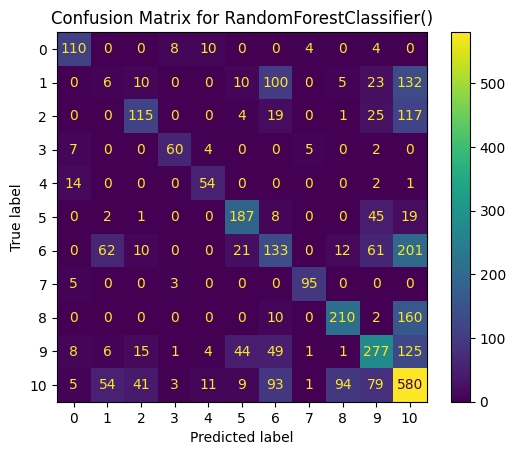

In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Train the best model (using the best model from the previous step)
best_model = models[best_model]  # Retrieve the model instance from the models dictionary
best_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred_best = best_model.predict(X_test)

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_best)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=sorted(y.unique()))
disp.plot(cmap='viridis', values_format='d')

# Add title and show the plot
plt.title(f'Confusion Matrix for {best_model}')
plt.show()


This code calculates and displays the performance metrics (precision, recall, and F1 score) for the best model on the test set. It uses the weighted average to handle multi-class classification. Additionally, it generates a classification report that includes precision, recall, F1 score, and support for each class, and prints it for detailed evaluation of the model's performance.

In [30]:
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report

# Calculate precision, recall, and F1 score for the best model
precision = precision_score(y_test, y_pred_best, average='weighted')  # Use 'weighted' for multi-class problems
recall = recall_score(y_test, y_pred_best, average='weighted')  # Use 'weighted' for multi-class problems
f1 = f1_score(y_test, y_pred_best, average='weighted')  # Use 'weighted' for multi-class problems

# Print the scores
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Ensure y.unique() is converted to strings
class_labels = [str(label) for label in sorted(y.unique())]

# Generate the classification report
report = classification_report(y_test, y_pred_best, target_names=class_labels)
print("\nClassification Report:")
print(report)

Precision: 0.49
Recall: 0.51
F1 Score: 0.49

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.81      0.77       136
           1       0.05      0.02      0.03       286
           2       0.60      0.41      0.49       281
           3       0.80      0.77      0.78        78
           4       0.65      0.76      0.70        71
           5       0.68      0.71      0.70       262
           6       0.32      0.27      0.29       500
           7       0.90      0.92      0.91       103
           8       0.65      0.55      0.60       382
           9       0.53      0.52      0.53       531
          10       0.43      0.60      0.50       970

    accuracy                           0.51      3600
   macro avg       0.58      0.58      0.57      3600
weighted avg       0.49      0.51      0.49      3600



# Final Model Save & Load

This code saves the trained best model (best_model) to a file named music_genre_classifier.pkl using joblib. This allows you to persist the model, so it can be loaded and used later without retraining.

In [31]:
import joblib

joblib.dump(best_model, 'music_genre_classifier.pkl')

['music_genre_classifier.pkl']

This code loads the previously saved model from the file music_genre_classifier.pkl using joblib.load(). It then prints the loaded model and its parameters using the get_params() method, which provides details about the model's configuration (such as hyperparameters).

In [32]:
loaded_model = joblib.load('music_genre_classifier.pkl')
print(loaded_model)
print("Model Parameters:", loaded_model.get_params())

RandomForestClassifier()
Model Parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


X_test[0:5] will display the first five rows of the test dataset (X_test). It gives a preview of the feature values (i.e., the input data) for the first five test samples. This is helpful for inspecting the data and verifying that it is correctly formatted.

In [33]:
X_test[0:5]

,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature
14297,0.252525,0.917151,0.414988,0.7,0.698744,1,0.433780,0.101406,0.178274,0.078838,0.557714,0.372018,0.092744,4
4119,0.121212,0.357650,0.968999,0.0,0.886363,1,0.037212,0.000007,0.034336,0.281449,0.288002,0.371210,0.124922,4
2008,0.181818,0.426512,0.352987,0.8,0.734621,1,0.013298,0.877510,0.000009,0.096245,0.327271,0.501774,0.000003,3
12571,0.252525,0.394233,0.960999,0.5,0.897983,1,0.046649,0.000008,0.180722,0.107378,0.336571,0.344875,0.159763,4
4755,0.343434,0.558855,0.739995,0.9,0.823734,0,0.005576,0.016466,0.655622,0.088756,0.758190,0.639322,0.144989,4


This code makes predictions on the first five samples of the test set (X_test[0:5]) using the loaded model (loaded_model). The predict method returns the predicted genres (or classes) for these samples. It then prints the predicted genres, allowing you to see how the model classifies the first five test instances.

In [34]:
prediction = loaded_model.predict(X_test[0:5])
print("Predicted Genre:", prediction)

Predicted Genre: [5 8 0 8 6]
